In [32]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import scipy.io
from scipy.interpolate import interp1d
import lmfit as lm
import scipy.cluster.hierarchy as ch

In [33]:
egfp=scipy.io.loadmat('egfp.mat')
egfp0=egfp['egfp'][0][0].T
egfp1=egfp['egfp'][0][1].T
egfp2=egfp['egfp'][0][2].T
egfp3=egfp['egfp'][0][3].T
egfp4=egfp['egfp'][0][4].T
egfp5=egfp['egfp'][0][5].T
print(egfp0.shape)
print(egfp1.shape)
egfp_lipo=np.vstack((egfp0,egfp1))
#print(egfp_lipo[0])
egfp_lipo=np.delete(egfp_lipo,385,axis=0) # this is a really bad dataset
print(egfp_lipo.shape)

(69, 87)
(375, 87)
(443, 87)


In [34]:
def twostage(t,t0,ktl,delta,beta,off=0):
    km=np.abs(ktl)
    delta=np.abs(delta)
    beta=np.abs(beta)
    t0=np.abs(t0)
    return off+(ktl/(delta-beta)*(1-np.exp(-(delta-beta)*(t-t0)))*np.exp(-beta*(t-t0))).clip(0)
twostage_model = lm.Model(twostage)

In [35]:
def threestage(t,t0,ktl,km,delta,beta,off=0):
    km=np.abs(km)
    ktl=np.abs(ktl)
    delta=np.abs(delta)
    beta=np.abs(beta)
    dmb = delta-beta
    bkm = beta + km
    dmbk = delta-bkm
    t0=np.abs(t0)
    dt=t-t0
    result = 1/dmb +km*np.exp(-dmb*dt)/dmb/dmbk-np.exp(-km*dt)/dmbk
    result = ktl*np.exp(-beta*dt)*result.clip(0)
    result[t<t0]=0
    return off+result
threestage_model = lm.Model(threestage)

[[Model]]
    Model(twostage)
[[Fit Statistics]]
    # function evals   = 72
    # data points      = 87
    # variables        = 5
    chi-square         = 3342.554
    reduced chi-square = 40.763
    Akaike info crit   = 332.576
    Bayesian info crit = 344.906
[[Variables]]
    t0:      2.37294164 +/- 0.070552 (2.97%) (init= 7)
    ktl:     1102.36269 +/- 49.99930 (4.54%) (init= 800)
    delta:  -0.05112507 +/- 24.23321 (47399.87%) (init= 0.07)
    beta:    0.05129844 +/- 24.22597 (47225.56%) (init= 0.05)
    off:     17.5694448 +/- 6.910524 (39.33%) (init= 0)
[[Correlations]] (unreported correlations are <  0.100)
    C(delta, beta)               =  1.000 
    C(t0, ktl)                   =  0.664 
    C(ktl, delta)                = -0.188 
    C(ktl, beta)                 = -0.187 
    C(t0, beta)                  =  0.172 
    C(t0, delta)                 =  0.172 

[[Model]]
    Model(threestage)
[[Fit Statistics]]
    # function evals   = 13994
    # data points      = 87
    #

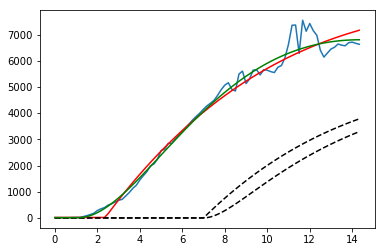

In [36]:
data = egfp_lipo[0]
sigma = np.sqrt(data)
time = np.arange(0,data.size)*10/60
result2 = twostage_model.fit(data, t=time, t0=7, ktl=800, delta=0.07, beta=0.05, weights=1/sigma)
result3 = threestage_model.fit(data, t=time, t0=7, ktl=800, km=1,delta=0.07, beta=0.05, weights=1/sigma)
plt.figure()
plt.plot(time,data)
plt.plot(time,result2.init_fit, 'k--')
plt.plot(time, result2.best_fit, 'r-')
plt.plot(time,result3.init_fit, 'k--')
plt.plot(time, result3.best_fit, 'g-')
plt.ylim((-0.05*data.max(),data.max()*1.05))
print(result2.fit_report())
print(result3.fit_report())

In [37]:
# cluster analysis to find the onset for fluorescence
# normalize the data
time_norm=(time-time.min())/50/(time.max()-time.min())
t0cluster_list=[]
for data in egfp_lipo:
    data_norm=(data-data.min())/(data.max()-data.min())
    data_diff_norm=np.gradient(data_norm)
    # combine the data
    X = np.vstack((time_norm,data_norm,data_diff_norm)).T
    # generate the linkage matrix
    Z = ch.linkage(X, method='single',metric='cityblock')
    tree = ch.cut_tree(Z, height=0.003).flatten()
    t0cluster_list.append(tree[tree==0].size)
t0cluster_list=np.array(t0cluster_list)
# convert to hours
t0cluster_list=(t0cluster_list)*10/60

data set 0 t0_guess 3.057928296881505
data set 1 t0_guess 3.3547235993279263
data set 2 t0_guess 3.278001529769527
data set 3 t0_guess 2.299705964379012
data set 4 t0_guess 4.863373335013905
data set 5 t0_guess 8.499588891961015
data set 6 t0_guess 3.5199962106524727
data set 7 t0_guess 4.413837398595802
data set 8 t0_guess 2.803954508799393
data set 9 t0_guess 3.9918085721975505
data set 10 t0_guess 3.0054659798557366
data set 11 t0_guess 2.9001929417771066
data set 12 t0_guess 3.880230668264567
data set 13 t0_guess 2.538484175903518
data set 14 t0_guess 2.9521078953448403
data set 15 t0_guess 3.123376712293375
data set 16 t0_guess 3.0470690818034063
data set 17 t0_guess 2.374881246379463
data set 18 t0_guess 4.866895933476187
data set 19 t0_guess 3.164578100205949
data set 20 t0_guess 0.9298518192084171


/Users/hstrey/anaconda/envs/python3/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


data set 21 t0_guess 2.786242869300327
data set 22 t0_guess 5.261641252098714
data set 23 t0_guess 3.4934562205834716
data set 24 t0_guess 4.180101934844782
data set 25 t0_guess 2.7323752876964558
data set 26 t0_guess 5.045200427350427
data set 27 t0_guess 3.3131319493730778
data set 28 t0_guess 4.172510416739126
data set 29 t0_guess 2.6196321447531408
data set 30 t0_guess 3.440474890919164
data set 31 t0_guess 5.260359162645407
data set 32 t0_guess 3.351578102030816
data set 33 t0_guess 6.343612607032756
data set 34 t0_guess 2.686791686918327
data set 35 t0_guess 6.104350884566123
data set 36 t0_guess 3.348992536672949
data set 37 t0_guess 3.092280056565251
data set 38 t0_guess 2.9120786144315507
data set 39 t0_guess 3.4500044474580225
data set 40 t0_guess 5.652940238611714
data set 41 t0_guess 3.424260310398609
data set 42 t0_guess 6.344108130804189
data set 43 t0_guess 2.8937885597436823
data set 44 t0_guess 4.498382312187481
data set 45 t0_guess 2.369182454053748
data set 46 t0_gue

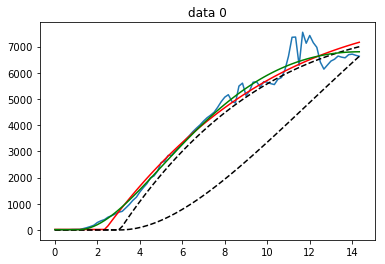

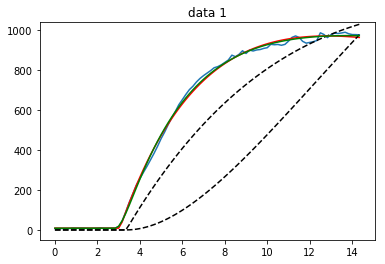

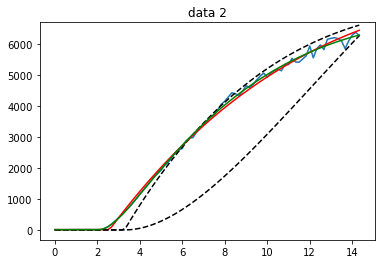

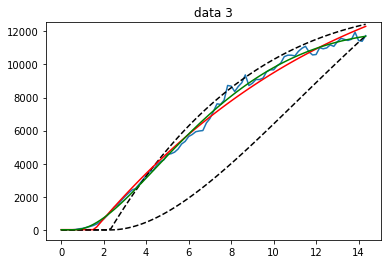

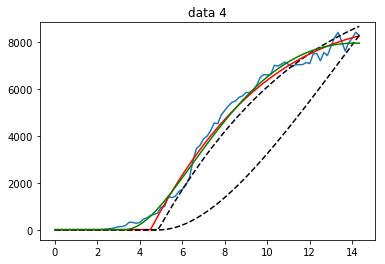

...

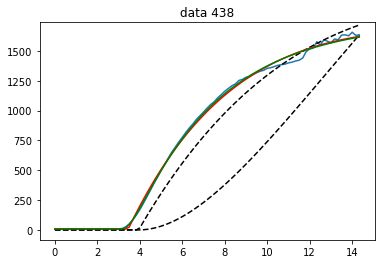

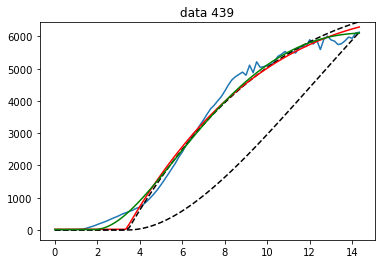

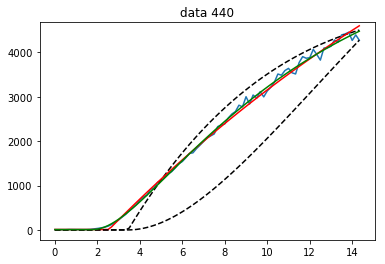

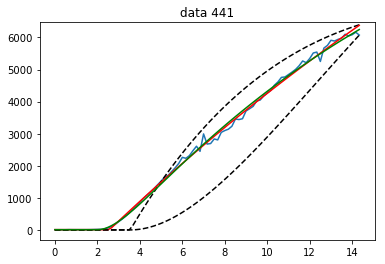

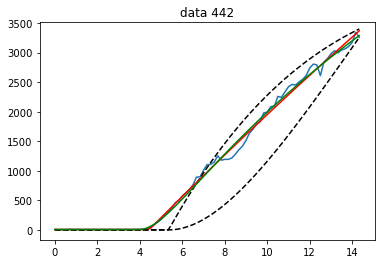

In [38]:
# two stage model
t0_list=[]
ktl_list=[]
delta_list=[]
beta_list=[]
t0_std_list=[]
ktl_std_list=[]
delta_std_list=[]
beta_std_list=[]
red_chi2_list=[]

# three stage model
t0_list3=[]
ktl_list3=[]
km_list3=[]
delta_list3=[]
beta_list3=[]
t0_std_list3=[]
ktl_std_list3=[]
km_std_list3=[]
delta_std_list3=[]
beta_std_list3=[]
red_chi2_list3=[]

for data,t0guess,i in zip(egfp_lipo,t0cluster_list,range(t0cluster_list.size)):
    sigma = np.sqrt(data)
    time = np.arange(0,data.size)*10/60
    # lets estimate the parameters
    # to estimate t0 we take I_max-I_min and estimate t for which I=I_min+0.1(I_max-Imin)
    # this can be done by interpolation.  The advantage is that the guess for t0 is greater
    # than the actual value - fits seems to converge better
    delta_I=data.max()-data.min()
    t0guess = interp1d(data,time)(data.min()+0.09*delta_I)
    print("data set",i,"t0_guess",t0guess)

    delta_t=time[-1]-t0guess
    
    two=twostage(np.array([delta_t]),0,1,0.08,0.05)
    ktl2=data[-1]/two[0]
    
    three=threestage(np.array([delta_t]),0,1,0.03,0.07,0.05)
    ktl3=data[-1]/three[0]
    
    result2 = twostage_model.fit(data, t=time, t0=t0guess, ktl=ktl2, delta=0.07, beta=0.05, weights=1/sigma)
    result3 = threestage_model.fit(data, t=time, t0=t0guess, ktl=ktl3, km=0.03,delta=0.07, beta=0.05, weights=1/sigma)

    plt.figure()
    plt.title("data "+str(i))
    plt.plot(time,data)
    plt.plot(time,result2.init_fit, 'k--')
    plt.plot(time, result2.best_fit, 'r-')
    plt.plot(time,result3.init_fit, 'k--')
    plt.plot(time, result3.best_fit, 'g-')
    plt.ylim((-0.05*data.max(),data.max()*1.05))
    
    if result2:
        t0_list.append(np.abs(result2.values['t0']))
        ktl_list.append(np.abs(result2.values['ktl']))
        delta_list.append(np.abs(result2.values['delta']))
        beta_list.append(np.abs(result2.values['beta']))
        red_chi2_list.append(result2.redchi)

        t0_std_list.append(result2.covar[0][0])
        ktl_std_list.append(result2.covar[1][1])
        delta_std_list.append(result2.covar[2][2])
        beta_std_list.append(result2.covar[3][3])
    
    if result3:
        t0_list3.append(np.abs(result3.values['t0']))
        ktl_list3.append(np.abs(result3.values['ktl']))
        km_list3.append(np.abs(result3.values['km']))
        delta_list3.append(np.abs(result3.values['delta']))
        beta_list3.append(np.abs(result3.values['beta']))
        red_chi2_list3.append(result3.redchi)

        t0_std_list3.append(result3.covar[0][0])
        ktl_std_list3.append(result3.covar[1][1])
        km_std_list3.append(result3.covar[2][2])
        delta_std_list3.append(result3.covar[3][3])
        beta_std_list3.append(result3.covar[4][4])
    
t0_list=np.array(t0_list)
ktl_list=np.array(ktl_list)
delta_list=np.array(delta_list)
beta_list=np.array(beta_list)
t0_std_list=np.array(t0_std_list)
ktl_std_list=np.array(ktl_std_list)
delta_std_list=np.array(delta_std_list)
beta_std_list=np.array(beta_std_list)

t0_list3=np.array(t0_list3)
ktl_list3=np.array(ktl_list3)
km_list3=np.array(km_list3)
delta_list3=np.array(delta_list3)
beta_list3=np.array(beta_list3)
t0_std_list3=np.array(t0_std_list3)
ktl_std_list3=np.array(ktl_std_list3)
km_std_list3=np.array(km_std_list3)
delta_std_list3=np.array(delta_std_list3)
beta_std_list3=np.array(beta_std_list3)

red_chi2_list=np.array(red_chi2_list)
red_chi2_list3=np.array(red_chi2_list3)


11.5836454345 5.58133767704
13.4626295557 7.33868500763
[ 51.27815422  40.45238367  15.89509585   6.85588952   2.98654522
   0.30670222]
[ 28.19419928  21.08552826   6.53077285   3.06400314   0.87199013
   0.11937065]


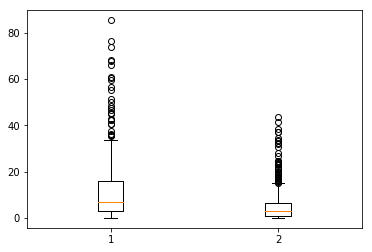

In [39]:
plt.boxplot([red_chi2_list,red_chi2_list3])
print(red_chi2_list.mean(),red_chi2_list3.mean())
print(red_chi2_list.std(),red_chi2_list3.std())
print(np.percentile(red_chi2_list,[97.5,95,75,50,25,2.5]))
print(np.percentile(red_chi2_list3,[97.5,95,75,50,25,2.5]))

In [40]:
print(np.argmax(red_chi2_list),red_chi2_list.max())
print(np.argmax(red_chi2_list3),red_chi2_list3.max())

322 85.3782762895
231 43.7104996436


In [41]:
# cleaning up the data by setting a threshold for redchi2
threshold2 = 100
threshold3 = 100
ktl_list_clean=ktl_list[red_chi2_list<threshold2]
delta_list_clean=delta_list[red_chi2_list<threshold2]
beta_list_clean=beta_list[red_chi2_list<threshold2]
t0_list_clean=t0_list[red_chi2_list<threshold2]
ktl_std_list_clean=ktl_std_list[red_chi2_list<threshold2]
delta_std_list_clean=delta_std_list[red_chi2_list<threshold2]
beta_std_list_clean=beta_std_list[red_chi2_list<threshold2]
t0_std_list_clean=t0_std_list[red_chi2_list<threshold2]

ktl_list3_clean=ktl_list3[red_chi2_list3<threshold3]
km_list3_clean=km_list3[red_chi2_list3<threshold3]
delta_list3_clean=delta_list3[red_chi2_list3<threshold3]
beta_list3_clean=beta_list3[red_chi2_list3<threshold3]
t0_list3_clean=t0_list3[red_chi2_list3<threshold3]
km_std_list3_clean=km_std_list3[red_chi2_list3<threshold3]
ktl_std_list3_clean=ktl_std_list3[red_chi2_list3<threshold3]
delta_std_list3_clean=delta_std_list3[red_chi2_list3<threshold3]
beta_std_list3_clean=beta_std_list3[red_chi2_list3<threshold3]
t0_std_list3_clean=t0_std_list3[red_chi2_list3<threshold3]


In [42]:
print(ktl_list.size,ktl_list_clean.size)
print(ktl_list3.size,ktl_list3_clean.size)

443 443
443 443


542.245538396 22347.6981705


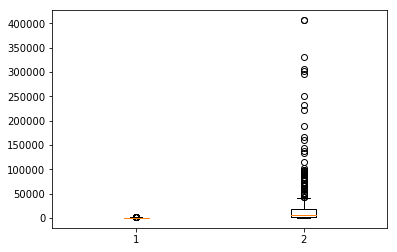

In [43]:
plt.boxplot([ktl_list_clean,ktl_list3_clean])
print(ktl_list_clean.mean(),ktl_list3_clean.mean())

(array([ 388.,   27.,   13.,    4.,    2.,    2.,    1.,    3.,    1.,    2.]),
 array([  1.40976359e+02,   4.07265230e+04,   8.13120696e+04,
          1.21897616e+05,   1.62483163e+05,   2.03068709e+05,
          2.43654256e+05,   2.84239803e+05,   3.24825349e+05,
          3.65410896e+05,   4.05996442e+05]),
 <a list of 10 Patch objects>)

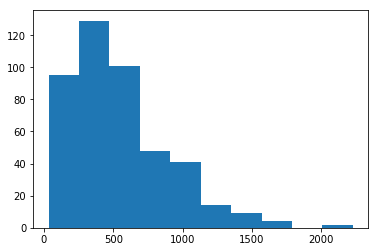

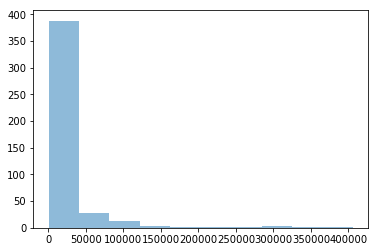

In [44]:
plt.figure()
plt.hist(ktl_list_clean)
plt.figure()
plt.hist(ktl_list3_clean,alpha=0.5)

(array([ 302.,   50.,   45.,   22.,   17.,    2.,    1.,    1.,    1.,    2.]),
 array([ 0.00156058,  0.12931874,  0.2570769 ,  0.38483506,  0.51259322,
         0.64035137,  0.76810953,  0.89586769,  1.02362585,  1.15138401,
         1.27914216]),
 <a list of 10 Patch objects>)

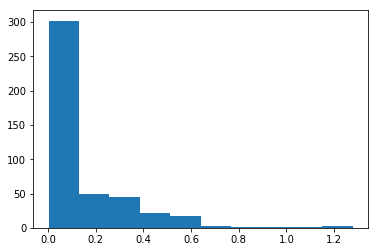

In [45]:
plt.figure()
plt.hist(km_list3_clean)

{'boxes': [<matplotlib.lines.Line2D at 0x136c5cdd8>,
 'caps': [<matplotlib.lines.Line2D at 0x136c67860>,
 'fliers': [<matplotlib.lines.Line2D at 0x136c6da58>,
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x136c6d240>,
 'whiskers': [<matplotlib.lines.Line2D at 0x136c5cf60>,
  <matplotlib.lines.Line2D at 0x136c79978>]}

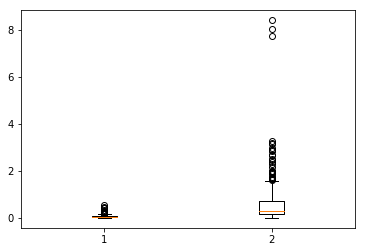

In [46]:
plt.boxplot([delta_list_clean,delta_list3_clean])

0.0636404136856 0.576383977987


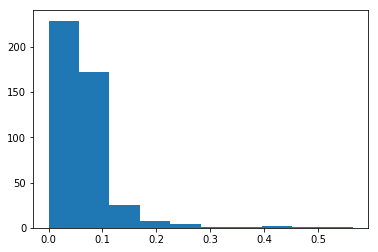

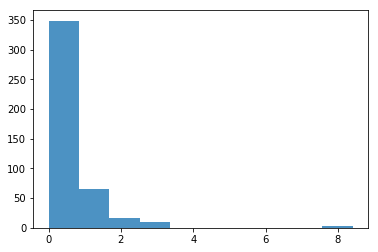

In [47]:
plt.figure()
plt.hist(delta_list_clean)
plt.figure()
plt.hist(delta_list3_clean,alpha=0.8)
print(delta_list_clean.mean(),delta_list3_clean.mean())

{'boxes': [<matplotlib.lines.Line2D at 0x13792a9b0>,
 'caps': [<matplotlib.lines.Line2D at 0x137931d68>,
 'fliers': [<matplotlib.lines.Line2D at 0x13793ecc0>,
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x137937dd8>,
 'whiskers': [<matplotlib.lines.Line2D at 0x13792ac18>,
  <matplotlib.lines.Line2D at 0x136dc2e80>]}

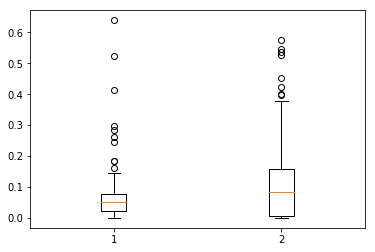

In [48]:
plt.boxplot([beta_list_clean,beta_list3_clean])

(array([ 190.,   72.,   89.,   39.,   21.,   18.,    7.,    3.,    0.,    4.]),
 array([  1.10039889e-08,   5.73616245e-02,   1.14723238e-01,
          1.72084851e-01,   2.29446465e-01,   2.86808078e-01,
          3.44169692e-01,   4.01531305e-01,   4.58892919e-01,
          5.16254532e-01,   5.73616146e-01]),
 <a list of 10 Patch objects>)

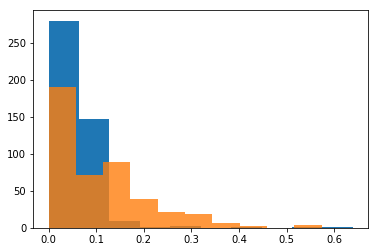

In [49]:
plt.hist(beta_list_clean)
plt.hist(beta_list3_clean,alpha=0.8)

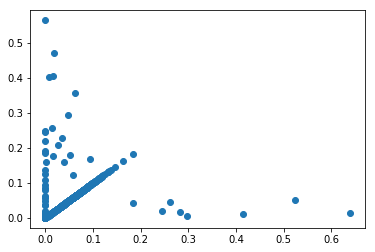

In [50]:
plt.plot(beta_list_clean,delta_list_clean,"o")

{'boxes': [<matplotlib.lines.Line2D at 0x13894d128>],
 'caps': [<matplotlib.lines.Line2D at 0x13894fb70>,
 'fliers': [<matplotlib.lines.Line2D at 0x138956d68>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x138956550>],
 'whiskers': [<matplotlib.lines.Line2D at 0x13894db00>,
  <matplotlib.lines.Line2D at 0x13894dc88>]}

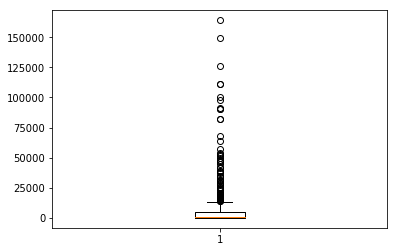

In [51]:
error_delta = delta_std_list_clean/delta_list_clean
plt.boxplot(error_delta)

{'boxes': [<matplotlib.lines.Line2D at 0x1378b8ac8>,
 'caps': [<matplotlib.lines.Line2D at 0x1378bfe80>,
 'fliers': [<matplotlib.lines.Line2D at 0x13950add8>,
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x139503ef0>,
 'whiskers': [<matplotlib.lines.Line2D at 0x1378b8d30>,
  <matplotlib.lines.Line2D at 0x139526f98>]}

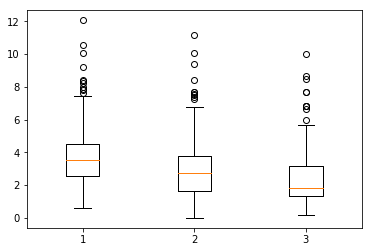

In [52]:
plt.boxplot([t0_list_clean,t0_list3_clean,t0cluster_list])

3.69176092572
2.87309244809
2.31339352897


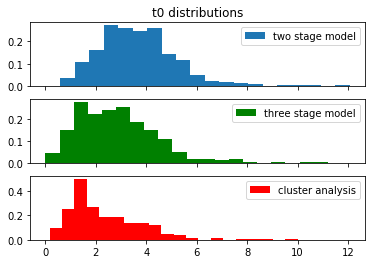

In [53]:
plt.figure()
# Two subplots, the axes array is 1-d
f, axarr = plt.subplots(3, sharex=True)
axarr[0].hist(t0_list_clean, bins=20,normed=True,label='two stage model')
axarr[0].set_title('t0 distributions')
axarr[0].legend()
axarr[1].hist(t0_list3_clean,bins=20,color='g',normed=True,label='three stage model')
axarr[1].legend()
axarr[2].hist(t0cluster_list,bins=20,color='r',normed=True,label='cluster analysis')
axarr[2].legend()
print(t0_list_clean.mean())
print(t0_list3_clean.mean())
print(t0cluster_list.mean())

In [54]:
# save data
np.save("lipo_t0_two",t0_list_clean)
np.save("lipo_t0_three",t0_list3_clean)
np.save("lipo_t0_cluster",t0cluster_list)

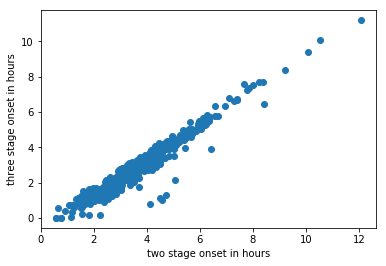

In [55]:
plt.plot(t0_list_clean,t0_list3_clean,"o")
plt.xlabel("two stage onset in hours")
plt.ylabel("three stage onset in hours")